In [ ]:
# projekt with PIRKY

In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import scipy.stats as stats

In [14]:
filename = "001/profiles.csv"
df_profiles = pd.read_csv(filename, sep='\t')
df_profiles.drop('Unnamed: 0', axis=1, inplace=True)
df_profiles.head()

,sex,blood_group,job,residence,birthdate,ssn,current_location,race,name
0,M,B-,Legal executive,"528 Allen Streets\nSolomonberg, NM 26158","05/28/1941, 00:00:00",359-18-7254,"(Decimal('29.4768335'), Decimal('-42.485892'))",White,John Fletcher
1,F,B+,Oceanographer,360 Rebecca Islands Suite 046\nEast Yolandavie...,1992-08-29,476-75-8468,"(Decimal('-80.467120'), Decimal('-106.725872'))",White,Alexis Benjamin
2,F,AB+,Academic librarian,"146 Ball Radial Suite 394\nEast Mark, AL 82880","12/16/1978, 00:00:00",425-66-2119,"(Decimal('-54.963860'), Decimal('-43.530569'))",Indian,Heather Lee
3,F,AB+,"Editor, magazine features","67264 Patterson Plains Apt. 319\nKennethshire,...",07 Apr 1921,869-12-0117,"(Decimal('-79.5156495'), Decimal('8.453819'))",Black,Laura Roman
4,F,O+,Secretary/administrator,"0975 Allen Manor\nSouth Davidville, NJ 88311",1998-12-07,296-87-0260,"(Decimal('49.395910'), Decimal('-15.478698'))",Asian,Miss Phyllis Oconnor


In [15]:
filename = "001/labor.csv"
df_labor = pd.read_csv(filename, sep='\t')
df_labor.drop('Unnamed: 0', axis=1, inplace=True)
df_labor.head()

,erytrocyty,trombocyty,weight,name,hbver,ssn,relationship,er-cv,smoker,indicator,hematokrit,leukocyty,alp,hemoglobin,ast,alt,etytr
0,5.75358,6.28829,72.99562,Ashley Mejia,7.83739,825-87-2350,separated,69.02328,N,0.0,6.68084,7.69536,76.74660,6.82079,61.73234,0.70514,4.81412
1,5.14673,7.42473,27.01891,Nicholas Cunningham,4.93689,180-95-1359,divoced,48.89584,N,1.0,6.67915,7.92839,17.17255,8.83229,78.07931,0.70497,5.96530
2,8.85321,6.19191,85.97257,Amy Pineda,7.81238,265-20-0465,nop,61.76278,no,0.0,8.37365,7.08646,9.29056,9.58719,74.48225,3.77250,7.79349
3,8.08038,6.66572,80.02693,Elizabeth Higgins,6.91584,075-09-7694,separated,44.51141,no,0.0,6.65188,8.49326,86.51256,5.78670,79.12359,2.39353,6.74682
4,8.91498,6.56509,119.48958,Andrew Ochoa,4.45796,850-79-7623,separated,42.06448,no,1.0,5.07778,5.72269,43.22939,7.71585,81.58218,4.34586,5.84598


In [35]:
df_merged = pd.merge(df_profiles,df_labor,on='name',how='outer')
df_merged.head()

,sex,blood_group,job,residence,birthdate,ssn_x,current_location,race,name,erytrocyty,...,er-cv,smoker,indicator,hematokrit,leukocyty,alp,hemoglobin,ast,alt,etytr
0,M,B-,Legal executive,"528 Allen Streets\nSolomonberg, NM 26158","05/28/1941, 00:00:00",359-18-7254,"(Decimal('29.4768335'), Decimal('-42.485892'))",White,John Fletcher,5.73089,...,54.28887,N,1.0,6.68658,8.13103,71.53264,5.51496,72.78350,1.40153,8.26858
1,M,B-,Legal executive,"528 Allen Streets\nSolomonberg, NM 26158","05/28/1941, 00:00:00",359-18-7254,"(Decimal('29.4768335'), Decimal('-42.485892'))",White,John Fletcher,7.00210,...,47.56065,no,1.0,8.14919,7.95707,53.26854,7.70607,70.42034,1.08658,8.76562
2,M,B-,Legal executive,"528 Allen Streets\nSolomonberg, NM 26158","05/28/1941, 00:00:00",359-18-7254,"(Decimal('29.4768335'), Decimal('-42.485892'))",White,John Fletcher,5.87203,...,53.69510,yes,1.0,8.61871,8.80296,71.23821,5.67911,63.46493,0.94280,7.87057
3,M,B-,Legal executive,"528 Allen Streets\nSolomonberg, NM 26158","05/28/1941, 00:00:00",359-18-7254,"(Decimal('29.4768335'), Decimal('-42.485892'))",White,John Fletcher,8.87748,...,53.84332,Y,1.0,6.05747,7.70553,64.00914,5.27333,76.12388,4.43028,6.29355
4,F,B+,Oceanographer,360 Rebecca Islands Suite 046\nEast Yolandavie...,1992-08-29,476-75-8468,"(Decimal('-80.467120'), Decimal('-106.725872'))",White,Alexis Benjamin,5.51507,...,36.38495,no,1.0,8.41361,8.02251,86.54993,6.48007,84.46566,1.39040,7.38177


In [18]:
df_merged.dtypes

sex                  object
blood_group          object
job                  object
residence            object
birthdate            object
ssn_x                object
current_location     object
race                 object
name                 object
erytrocyty          float64
trombocyty          float64
weight              float64
hbver               float64
ssn_y                object
relationship         object
er-cv               float64
smoker               object
indicator           float64
hematokrit          float64
leukocyty           float64
alp                 float64
hemoglobin          float64
ast                 float64
alt                 float64
etytr               float64
dtype: object

In [19]:
df_merged.describe()

,erytrocyty,trombocyty,weight,hbver,er-cv,indicator,hematokrit,leukocyty,alp,hemoglobin,ast,alt,etytr
count,10464.000000,10462.000000,10495.000000,10464.000000,10464.000000,10495.000000,10465.000000,10464.000000,10465.000000,10462.000000,10462.000000,10463.000000,10463.000000
mean,6.797553,6.800557,70.036078,7.189203,54.895975,0.642211,6.824631,7.227896,68.704426,6.807972,73.526168,2.428059,6.805558
std,1.584803,1.005890,34.875698,1.732465,11.638543,0.479373,0.997630,1.648886,19.911391,1.006951,6.420153,4.364798,1.533215
min,2.538130,2.785270,-51.100280,1.511190,0.000000,0.000000,2.665920,0.000000,0.000000,2.561810,0.000000,0.000000,2.478170
25%,5.559750,6.124598,46.770755,5.906990,47.064177,0.000000,6.166980,6.346930,58.057720,6.120150,69.238322,0.924240,5.570295
50%,6.582500,6.822390,69.897610,7.248590,54.761415,1.000000,6.831870,7.536260,75.461340,6.808200,73.521405,1.244000,6.606850
75%,7.985615,7.478460,93.122510,8.398238,62.805137,1.000000,7.495720,8.365932,83.817770,7.493805,77.759380,2.267315,8.017560
max,12.235280,10.678970,200.452940,13.809250,100.000000,1.000000,10.643140,12.060330,100.000000,10.245150,100.000000,100.000000,13.764860


In [34]:
df_merged.isnull().sum()

sex                 0
blood_group         0
job                 0
residence           0
birthdate           0
ssn_x               0
current_location    0
race                0
name                0
erytrocyty          0
trombocyty          0
weight              0
hbver               0
ssn_y               0
relationship        0
er-cv               0
smoker              0
indicator           0
hematokrit          0
leukocyty           0
alp                 0
hemoglobin          0
ast                 0
alt                 0
etytr               0
dtype: int64

In [33]:
df_merged.dropna(subset = ["erytrocyty", "trombocyty", "hbver", "er-cv", "hematokrit", "leukocyty", "alp", "hemoglobin", "ast", "alt", "etytr"], inplace=True)

In [46]:
df_merged.replace('no', 'N', inplace=True);
df_merged.replace('yes', 'Y', inplace=True);
df_merged.replace('black', 'Black', inplace=True);
df_merged.replace('blsck', 'Black', inplace=True);
df_merged.replace('white', 'White', inplace=True);
df_merged.head()

,sex,blood_group,job,residence,birthdate,ssn_x,current_location,race,name,erytrocyty,...,er-cv,smoker,indicator,hematokrit,leukocyty,alp,hemoglobin,ast,alt,etytr
0,M,B-,Legal executive,"528 Allen Streets\nSolomonberg, NM 26158","05/28/1941, 00:00:00",359-18-7254,"(Decimal('29.4768335'), Decimal('-42.485892'))",White,John Fletcher,5.73089,...,54.28887,N,1.0,6.68658,8.13103,71.53264,5.51496,72.78350,1.40153,8.26858
1,M,B-,Legal executive,"528 Allen Streets\nSolomonberg, NM 26158","05/28/1941, 00:00:00",359-18-7254,"(Decimal('29.4768335'), Decimal('-42.485892'))",White,John Fletcher,7.00210,...,47.56065,N,1.0,8.14919,7.95707,53.26854,7.70607,70.42034,1.08658,8.76562
2,M,B-,Legal executive,"528 Allen Streets\nSolomonberg, NM 26158","05/28/1941, 00:00:00",359-18-7254,"(Decimal('29.4768335'), Decimal('-42.485892'))",White,John Fletcher,5.87203,...,53.69510,Y,1.0,8.61871,8.80296,71.23821,5.67911,63.46493,0.94280,7.87057
3,M,B-,Legal executive,"528 Allen Streets\nSolomonberg, NM 26158","05/28/1941, 00:00:00",359-18-7254,"(Decimal('29.4768335'), Decimal('-42.485892'))",White,John Fletcher,8.87748,...,53.84332,Y,1.0,6.05747,7.70553,64.00914,5.27333,76.12388,4.43028,6.29355
4,F,B+,Oceanographer,360 Rebecca Islands Suite 046\nEast Yolandavie...,1992-08-29,476-75-8468,"(Decimal('-80.467120'), Decimal('-106.725872'))",White,Alexis Benjamin,5.51507,...,36.38495,N,1.0,8.41361,8.02251,86.54993,6.48007,84.46566,1.39040,7.38177


array([[<AxesSubplot:title={'center':'erytrocyty'}>,
        <AxesSubplot:title={'center':'trombocyty'}>,
        <AxesSubplot:title={'center':'weight'}>,
        <AxesSubplot:title={'center':'hbver'}>],
       [<AxesSubplot:title={'center':'er-cv'}>,
        <AxesSubplot:title={'center':'indicator'}>,
        <AxesSubplot:title={'center':'hematokrit'}>,
        <AxesSubplot:title={'center':'leukocyty'}>],
       [<AxesSubplot:title={'center':'alp'}>,
        <AxesSubplot:title={'center':'hemoglobin'}>,
        <AxesSubplot:title={'center':'ast'}>,
        <AxesSubplot:title={'center':'alt'}>],
       [<AxesSubplot:title={'center':'etytr'}>, <AxesSubplot:>,
        <AxesSubplot:>, <AxesSubplot:>]], dtype=object)

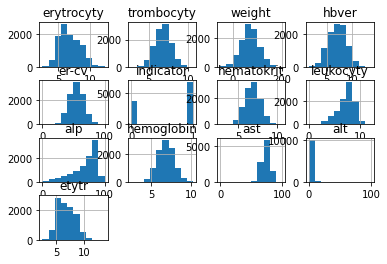

In [52]:
df_merged.hist()

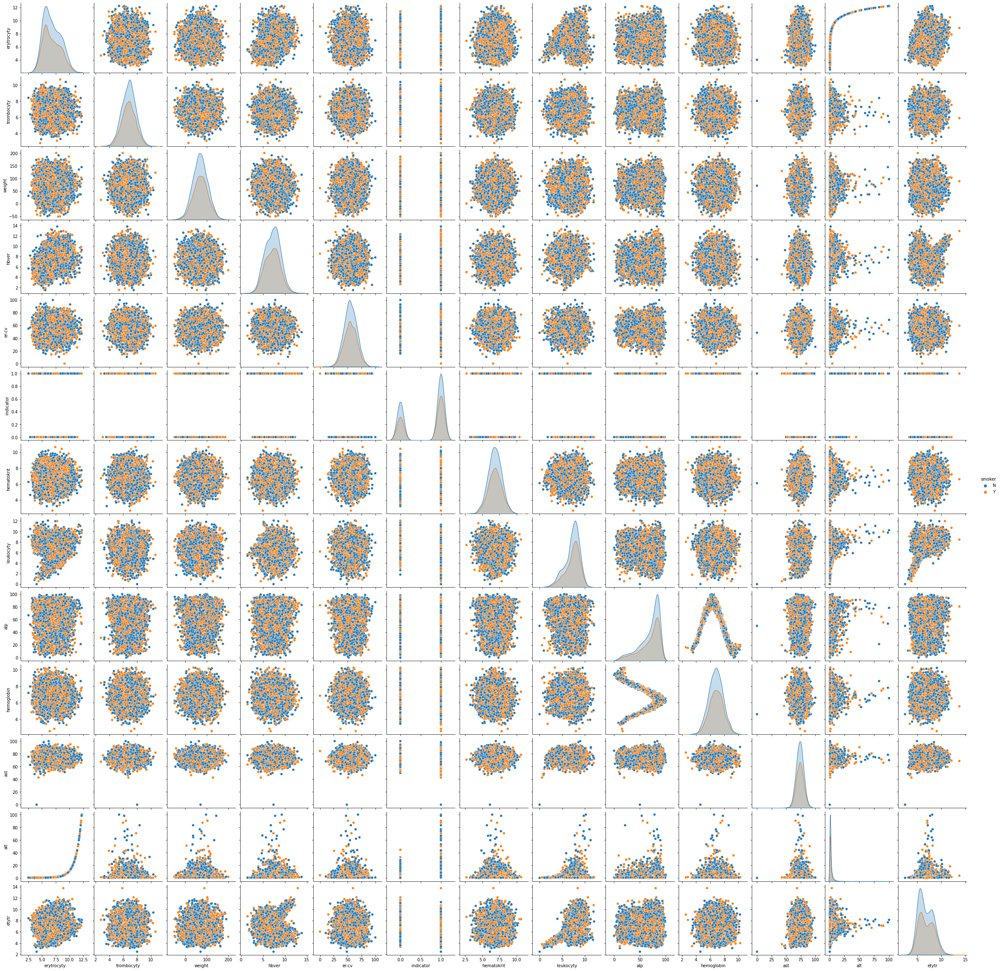

In [55]:
sns.pairplot(df_merged, hue="smoker")

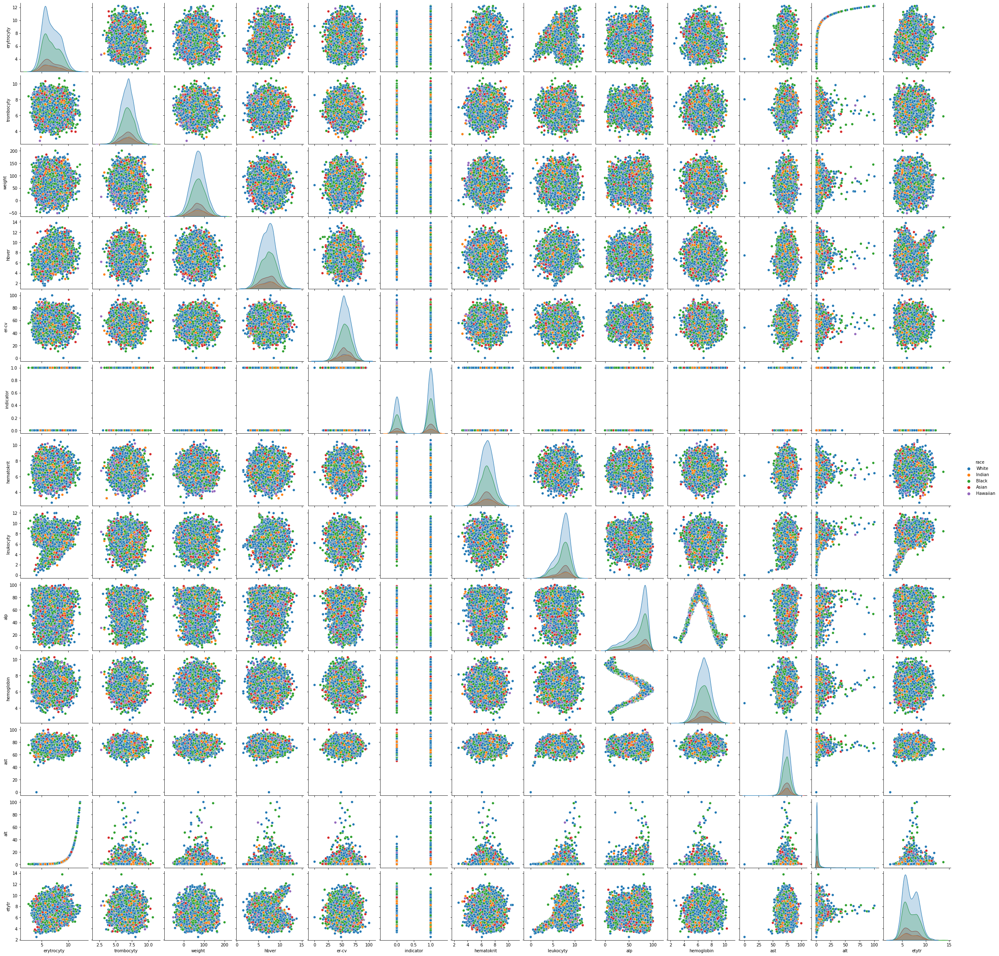

In [56]:
sns.pairplot(df_merged, hue="race")

<AxesSubplot:>

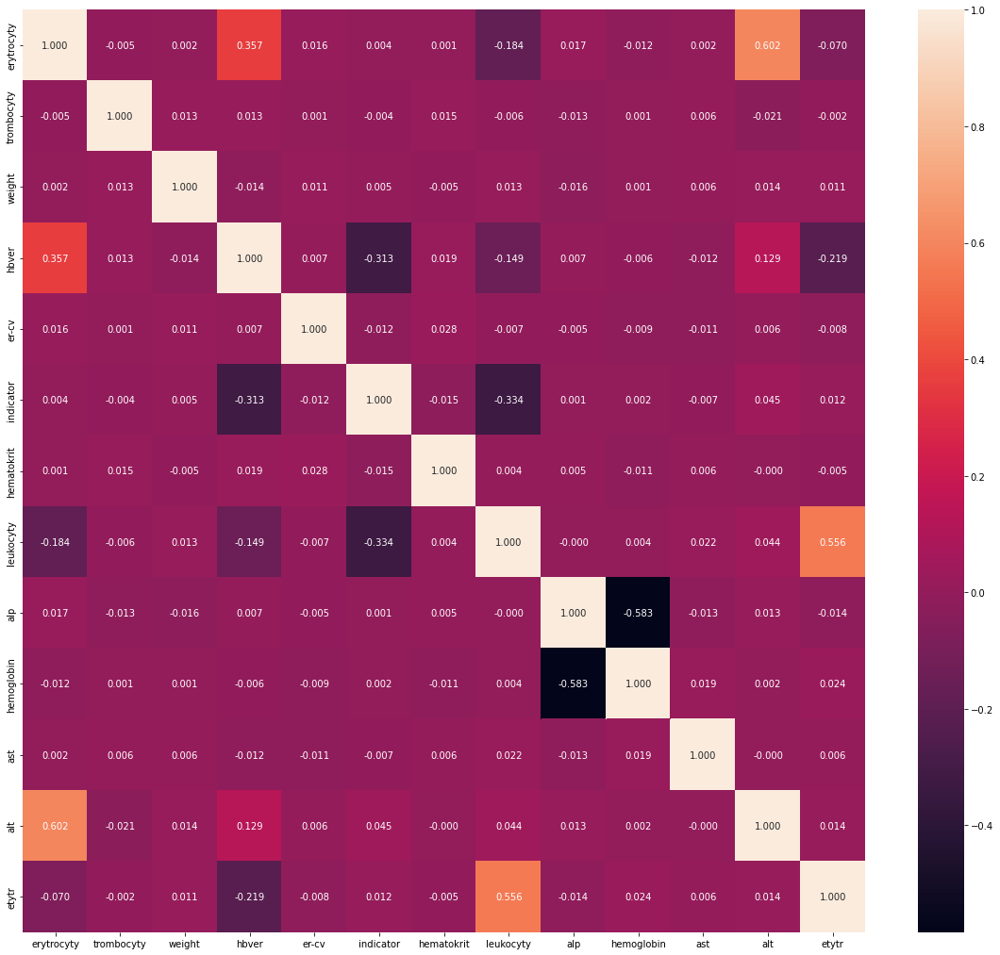

In [59]:
fig, ax = plt.subplots(figsize=(20,18))
sns.heatmap(df_merged.corr(), ax=ax, annot=True, fmt=".3f")

<AxesSubplot:xlabel='erytrocyty', ylabel='etytr'>

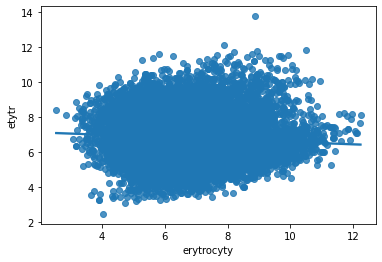

In [61]:
sns.regplot(x="erytrocyty", y="etytr", data=df_merged)